## Семантическая сегментация

In [1]:
import torch
import matplotlib.pyplot as plt

In [2]:
import torchvision.transforms.v2 as T
from torchvision.datasets import OxfordIIITPet

dataset = OxfordIIITPet('../datasets/pets', target_types='segmentation', download=True)

In [3]:
dataset[0]

(<PIL.Image.Image image mode=RGB size=394x500>,
 <PIL.PngImagePlugin.PngImageFile image mode=L size=394x500>)

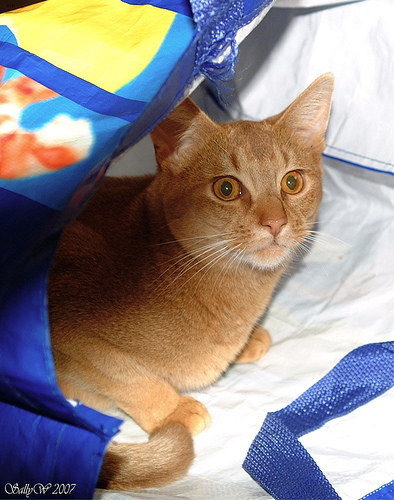

In [4]:
dataset[0][0]

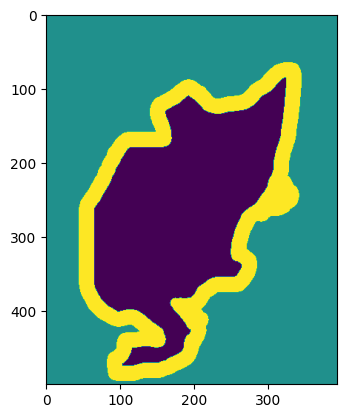

In [5]:
plt.imshow(dataset[0][1])

In [6]:
import numpy as np

np.unique(np.array(dataset[0][1]))

array([1, 2, 3], dtype=uint8)

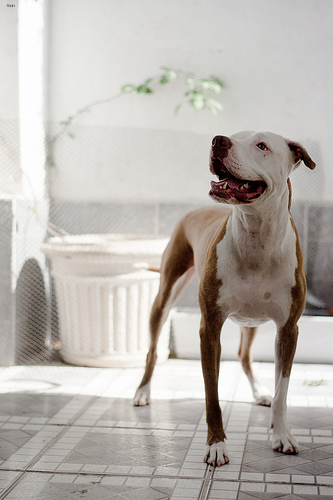

In [7]:
dataset[100][0]

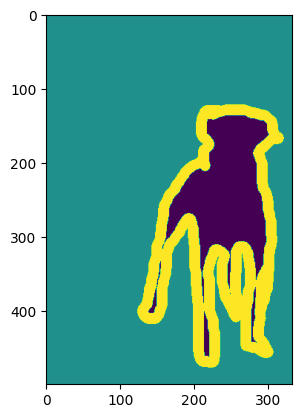

In [8]:
plt.imshow(dataset[100][1])

In [ ]:
(3, n, n) -> (C, n, n)


In [9]:
transform = T.Compose(
    [
        T.Resize((128, 128)),
        T.ToTensor(),
    ]
)

target_transform = T.Compose(
    [
        T.Resize((128, 128)),
        T.PILToTensor(),
        T.Lambda(lambda x: (x - 1).long())
    ]
)

train_dataset = OxfordIIITPet('../datasets/pets', transform=transform, target_transform=target_transform, target_types='segmentation')
valid_dataset = OxfordIIITPet('../datasets/pets', transform=transform, split='test', target_transform=target_transform, target_types='segmentation')

/usr/local/lib/python3.10/dist-packages/torchvision/transforms/v2/_deprecated.py:43: UserWarning: The transform `ToTensor()` is deprecated and will be removed in a future release. Instead, please use `v2.Compose([v2.ToImage(), v2.ToDtype(torch.float32, scale=True)])`.
  warnings.warn(


In [10]:
from torch.utils.data import DataLoader

train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True, num_workers=8)
valid_loader = DataLoader(valid_dataset, batch_size=64, shuffle=False, num_workers=8)

In [11]:
import torch.nn as nn
from torch.utils.data import DataLoader
from torch.optim import Optimizer
from tqdm import tqdm


def train(model: nn.Module, data_loader: DataLoader, optimizer: Optimizer, loss_fn, device: torch.device):
    model.train()

    total_loss = 0
    total = 0
    correct = 0

    for x, y in tqdm(data_loader):
        bs = y.size(0)

        x, y = x.to(device), y.squeeze(1).to(device)

        optimizer.zero_grad()

        output = model(x)

        loss = loss_fn(output, y)

        loss.backward()

        total_loss += loss.item()
        
        _, y_pred = output.max(dim=1)
        total += y.size(0) * y.size(1) * y.size(2)
        correct += (y == y_pred).sum().item()

        optimizer.step()

    return total_loss / len(data_loader), correct / total


In [12]:
import torch
import torch.nn as nn
from torch.utils.data import DataLoader


@torch.inference_mode()
def evaluate(model: nn.Module, data_loader: DataLoader, loss_fn, device: torch.device):
    model.eval()

    total_loss = 0
    total = 0
    correct = 0

    for x, y in tqdm(data_loader):
        bs = y.size(0)

        x, y = x.to(device), y.squeeze(1).to(device)

        output = model(x)

        loss = loss_fn(output, y)

        total_loss += loss.item()

        _, y_pred = output.max(dim=1)
        total += y.size(0) * y.size(1) * y.size(2)
        correct += (y == y_pred).sum().item()

    return total_loss / len(data_loader), correct / total


In [13]:
import matplotlib.pyplot as plt
import seaborn as sns


sns.set(style='darkgrid')


def plot_stats(
    train_loss: list[float],
    valid_loss: list[float],
    train_accuracy: list[float],
    valid_accuracy: list[float],
    title: str
):
    plt.figure(figsize=(16, 8))

    plt.title(title + ' loss')

    plt.plot(train_loss, label='Train loss')
    plt.plot(valid_loss, label='Valid loss')
    plt.legend()

    plt.show()
    
    plt.figure(figsize=(16, 8))

    plt.title(title + ' accuracy')

    plt.plot(train_accuracy, label='Train accuracy')
    plt.plot(valid_accuracy, label='Valid accuracy')
    plt.legend()

    plt.show()

In [14]:
import numpy as np
from PIL import Image


@torch.inference_mode()
def visualize(model, batch, device):
    model.eval()

    xs, ys = batch
    
    to_pil = T.ToPILImage()

    for i, (x, y) in enumerate(zip(xs, ys)):
        prediction = model(x.unsqueeze(0).to(device)).cpu().squeeze(0).max(dim=0)[1]

        fig, ax = plt.subplots(1, 3, figsize=(24, 8), facecolor='white')

        ax[0].imshow(to_pil(x))
        ax[1].imshow(to_pil(y.to(torch.uint8)))
        ax[2].imshow(to_pil(prediction.to(torch.uint8)))

        ax[0].axis('off')
        ax[1].axis('off')
        ax[2].axis('off')

        ax[0].set_title('Original image')
        ax[1].set_title('Segmentation mask')
        ax[2].set_title('Prediction')

        plt.subplots_adjust(wspace=0, hspace=0.1)
        plt.show()

        if i >= 9:
            break

In [15]:
from IPython.display import clear_output


def fit(model, train_loader, valid_loader, optimizer, loss_fn, device, num_epochs, title):
    train_loss_history, valid_loss_history = [], []
    train_accuracy_history, valid_accuracy_history = [], []
    
    valid_iterator = iter(valid_loader)

    for epoch in range(num_epochs):
        train_loss, train_accuracy = train(model, train_loader, optimizer, loss_fn, device)
        valid_loss, valid_accuracy = evaluate(model, valid_loader, loss_fn, device)

        train_loss_history.append(train_loss)
        valid_loss_history.append(valid_loss)
        
        train_accuracy_history.append(train_accuracy)
        valid_accuracy_history.append(valid_accuracy)

        clear_output()

        plot_stats(
            train_loss_history, valid_loss_history,
            train_accuracy_history, valid_accuracy_history,
            title
        )

        visualize(model, next(valid_iterator), device)

Unet paper https://arxiv.org/abs/1505.04597

In [18]:
def conv_plus_conv(in_channels: int, out_channels: int):
    """
    Makes UNet block
    :param in_channels: input channels
    :param out_channels: output channels
    :return: UNet block
    """
    return nn.Sequential(
        nn.Conv2d(
            in_channels=in_channels,
            out_channels=out_channels,
            kernel_size=3,
            stride=1,
            padding=1
        ),
        nn.BatchNorm2d(num_features=out_channels),
        nn.LeakyReLU(0.2),
        nn.Conv2d(
            in_channels=out_channels,
            out_channels=out_channels,
            kernel_size=3,
            stride=1,
            padding=1
        ),
        nn.BatchNorm2d(num_features=out_channels),
        nn.LeakyReLU(0.2),
    )


class UNET(nn.Module):
    def __init__(self):
        super().__init__()

        base_channels = 32

        self.down1 = conv_plus_conv(3, base_channels)
        self.down2 = conv_plus_conv(base_channels, base_channels * 2)
        self.down3 = conv_plus_conv(base_channels * 2, base_channels * 4)
        self.down4 = conv_plus_conv(base_channels * 4, base_channels * 8)
        self.down5 = conv_plus_conv(base_channels * 8, base_channels * 16)
        
        self.up1 = conv_plus_conv(base_channels * 2, base_channels)
        self.up2 = conv_plus_conv(base_channels * 4, base_channels)
        self.up3 = conv_plus_conv(base_channels * 8, base_channels * 2)
        self.up4 = conv_plus_conv(base_channels * 16, base_channels * 4)
        self.up5 = conv_plus_conv(base_channels * 32, base_channels * 8)

        self.bottleneck = conv_plus_conv(base_channels * 16, base_channels * 16)

        self.out = nn.Conv2d(in_channels=base_channels, out_channels=3, kernel_size=1)

        self.downsample = nn.MaxPool2d(kernel_size=2, stride=2)

    def forward(self, x):
        # x.shape = (N, N, 3)

        residual1 = self.down1(x)  # x.shape: (N, N, 3) -> (N, N, base_channels)
        x = self.downsample(residual1)  # x.shape: (N, N, base_channels) -> (N // 2, N // 2, base_channels)

        residual2 = self.down2(x)  # x.shape: (N // 2, N // 2, base_channels) -> (N // 2, N // 2, base_channels * 2)
        x = self.downsample(residual2)  # x.shape: (N // 2, N // 2, base_channels * 2) -> (N // 4, N // 4, base_channels * 2)

        residual3 = self.down3(x)
        x = self.downsample(residual3)

        residual4 = self.down4(x)
        x = self.downsample(residual4)

        residual5 = self.down5(x)
        x = self.downsample(residual5)

        # LATENT SPACE DIMENSION DIM = N // 32
        # SOME MANIPULATION MAYBE
        x = self.bottleneck(x)  # x.shape: (N // 32, N // 32, base_channels * 16) -> (N // 32, N // 32, base_channels * 16)
        # SOME MANIPULATION MAYBE
        # LATENT SPACE DIMENSION DIM = N // 32

        x = nn.functional.interpolate(x, scale_factor=2)  # x.shape: (N // 32, N // 32, base_channels * 16) -> (N // 16, N // 16, base_channels * 16)
        x = torch.cat((x, residual5), dim=1)  # 32
        x = self.up5(x)  # 8

        x = nn.functional.interpolate(x, scale_factor=2)  # 8
        x = torch.cat((x, residual4), dim=1)  # 16
        x = self.up4(x)  # 4

        x = nn.functional.interpolate(x, scale_factor=2)
        x = torch.cat((x, residual3), dim=1)
        x = self.up3(x)

        x = nn.functional.interpolate(x, scale_factor=2)  # x.shape: (N // 4, N // 4, base_channels * 2) -> (N // 2, N // 2, base_channels * 2)
        x = torch.cat((x, residual2), dim=1)  # x.shape: (N // 2, N // 2, base_channels * 2) -> (N // 2, N // 2, base_channels * 4)
        x = self.up2(x)  # x.shape: (N // 2, N // 2, base_channels * 4) -> (N // 2, N // 2, base_channels)

        x = nn.functional.interpolate(x, scale_factor=2)  # x.shape: (N // 2, N // 2, base_channels) -> (N, N, base_channels)
        x = torch.cat((x, residual1), dim=1)  # x.shape: (N, N, base_channels) -> (N, N, base_channels * 2)
        x = self.up1(x)  # x.shape: (N, N, base_channels * 2) -> (N, N, base_channels)

        x = self.out(x)  # x.shape: (N, N, base_channels) -> (N, N, classes)

        return x

In [16]:
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

print(device)
print(torch.cuda.get_device_name())

loss_fn = nn.CrossEntropyLoss()

cuda:0
NVIDIA GeForce RTX 4090


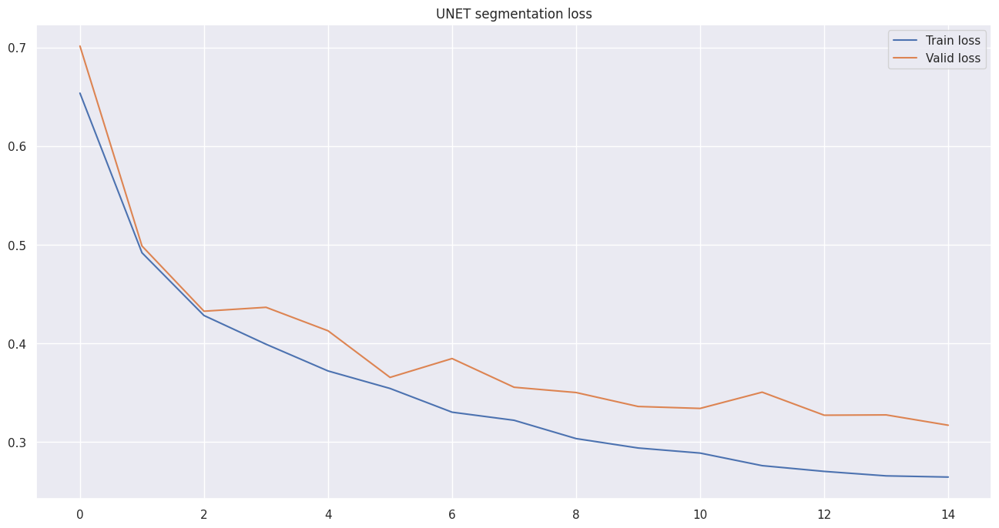

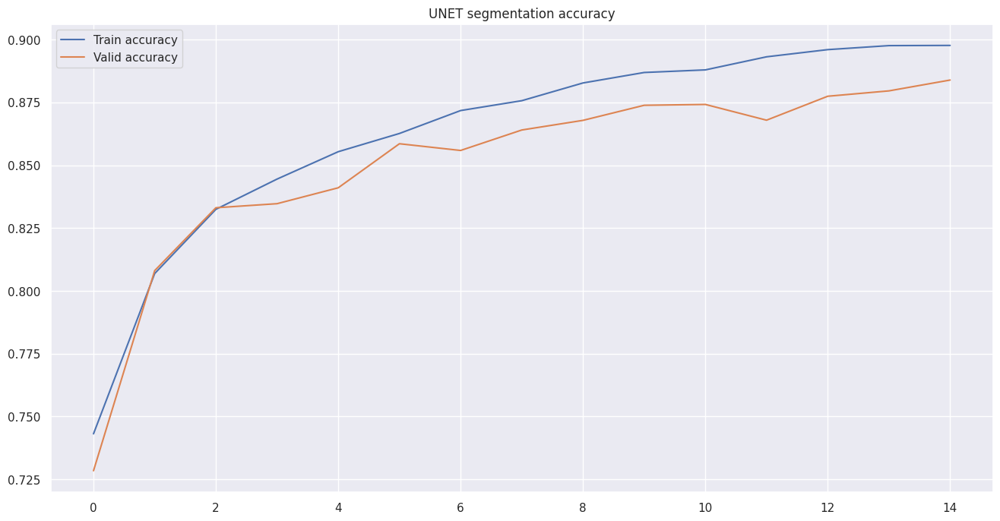

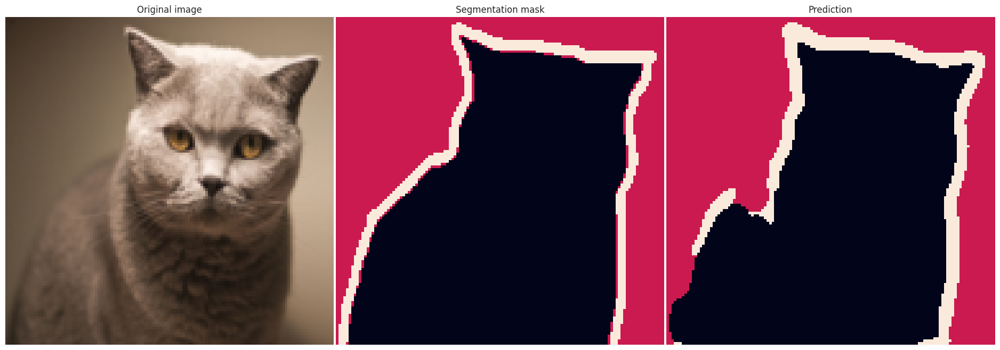

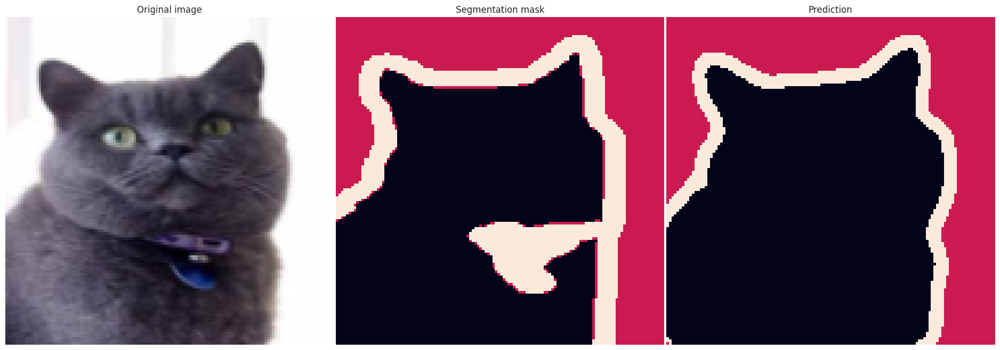

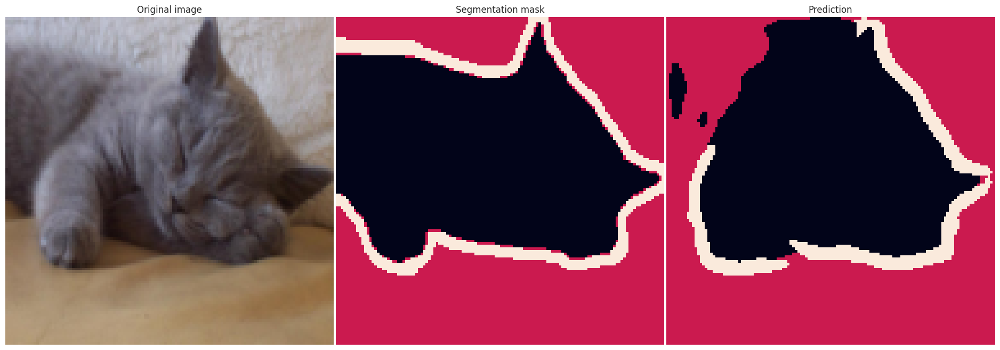

...

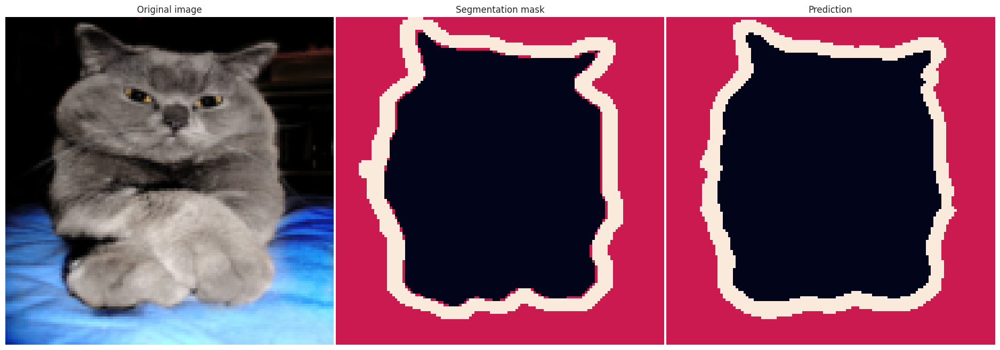

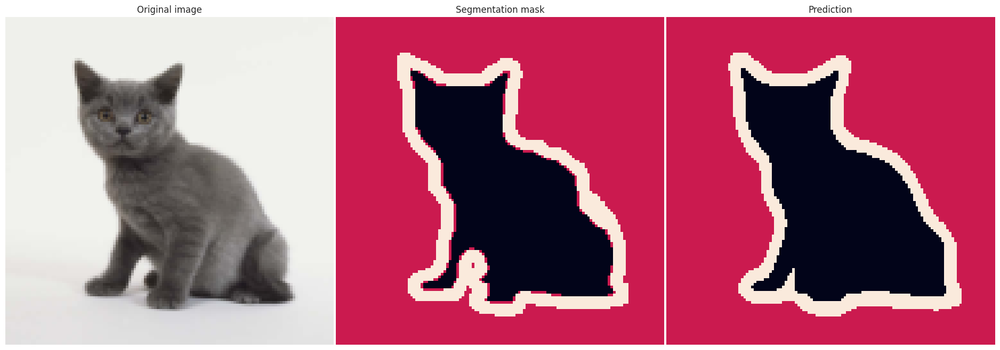

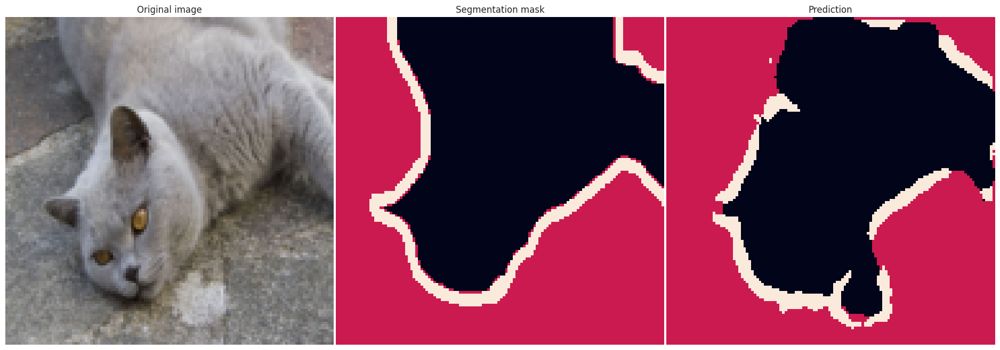

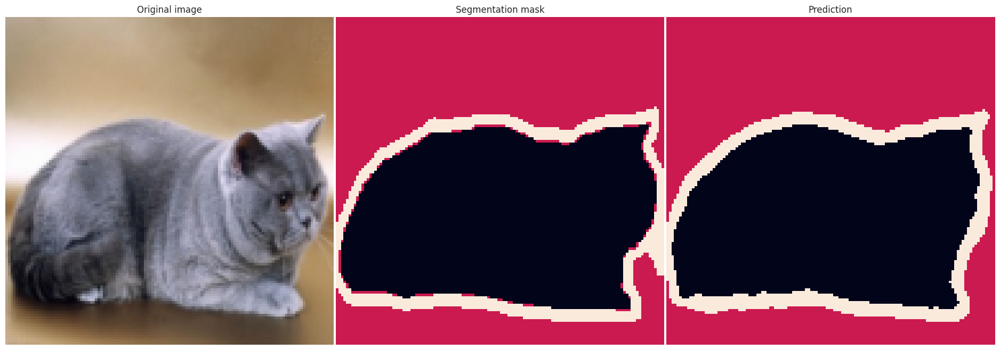

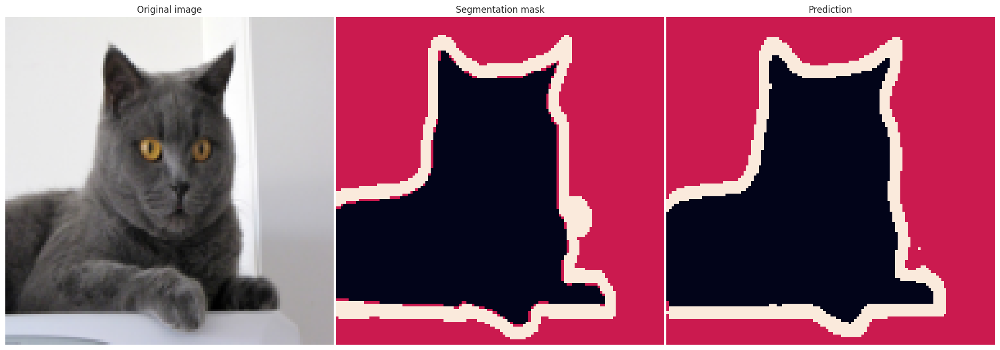

In [20]:
from torch.optim import Adam


model = UNET().to(device)

optimizer = Adam(model.parameters(), lr=1e-3)

fit(model, train_loader, valid_loader, optimizer, loss_fn, device, 15, 'UNET segmentation')

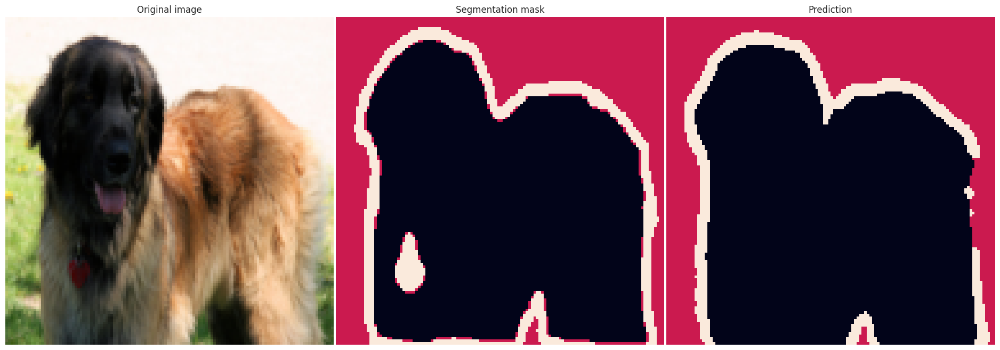

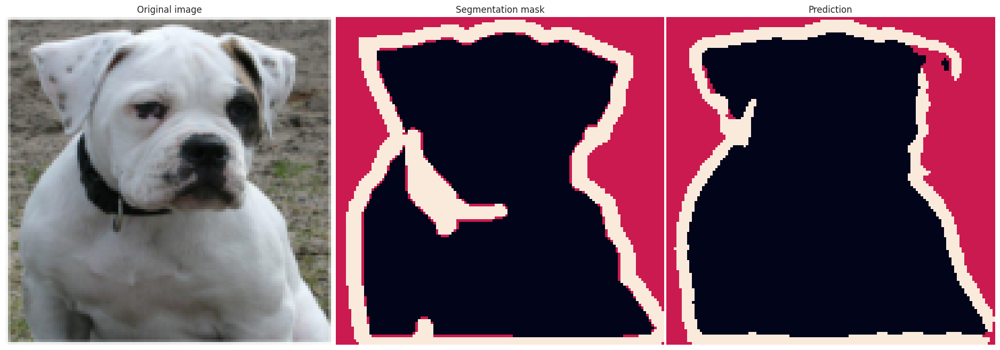

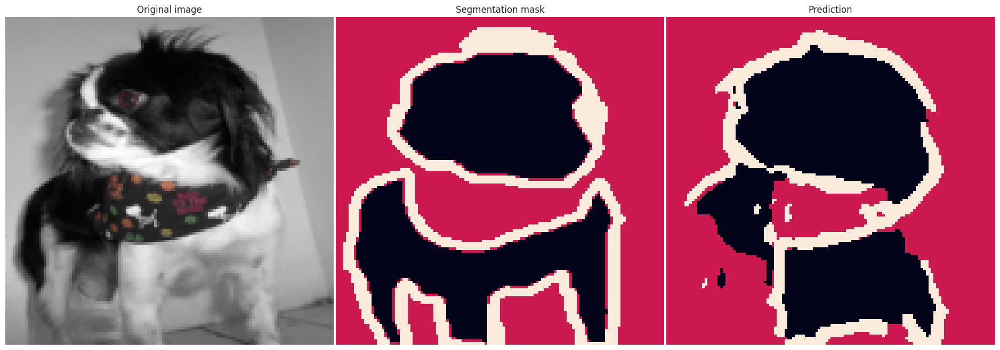

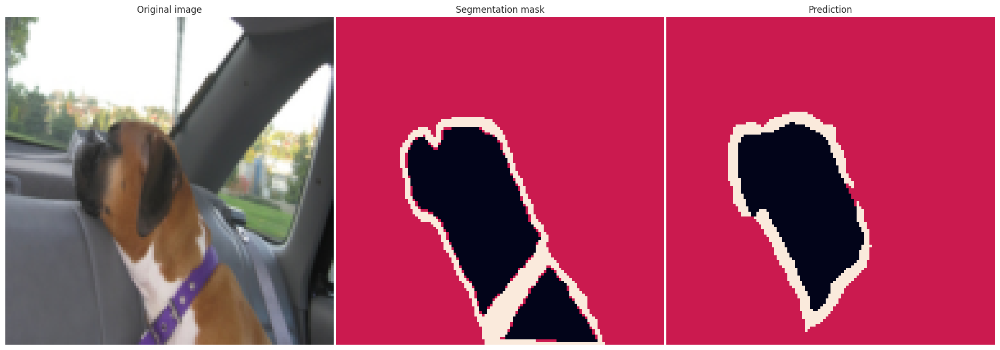

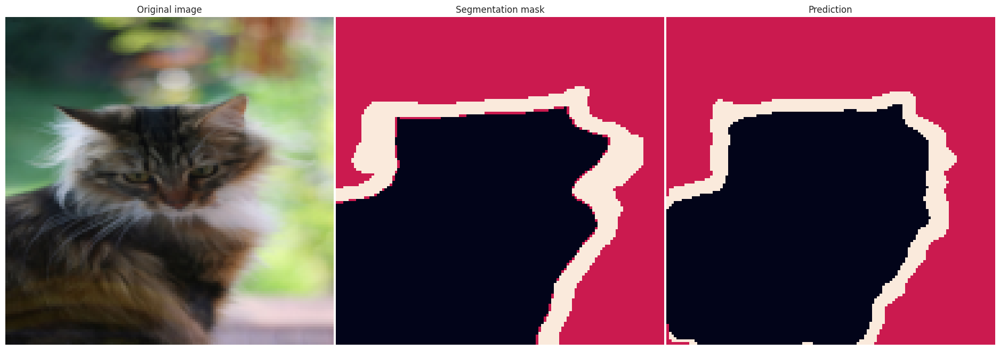

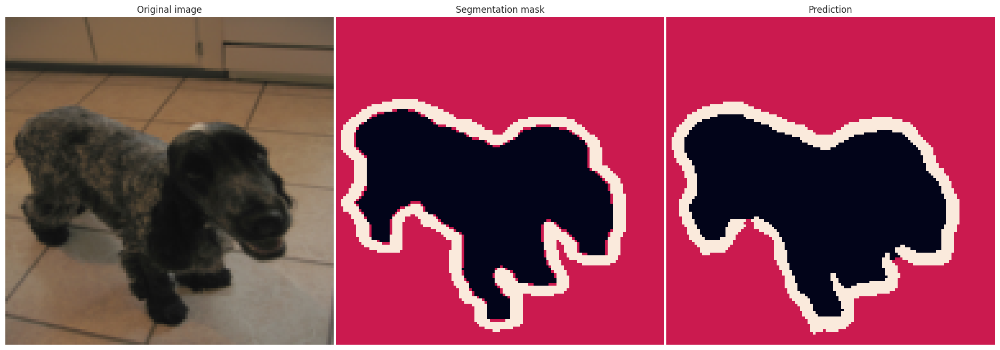

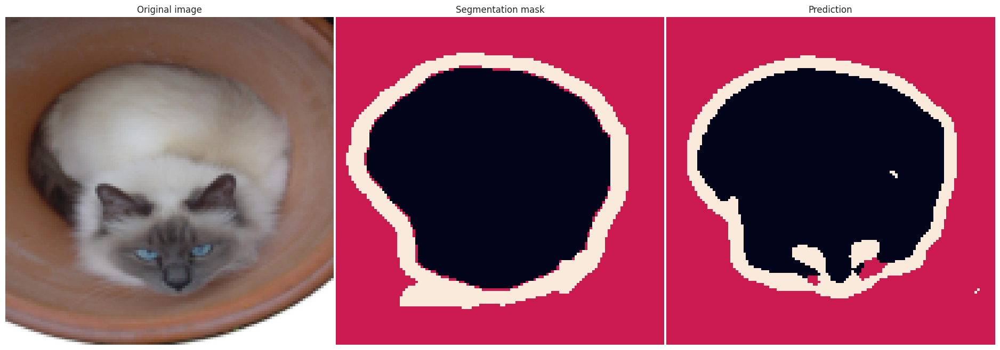

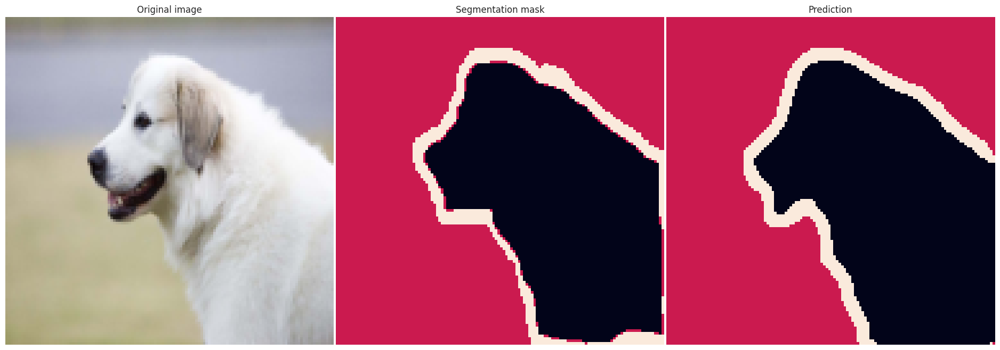

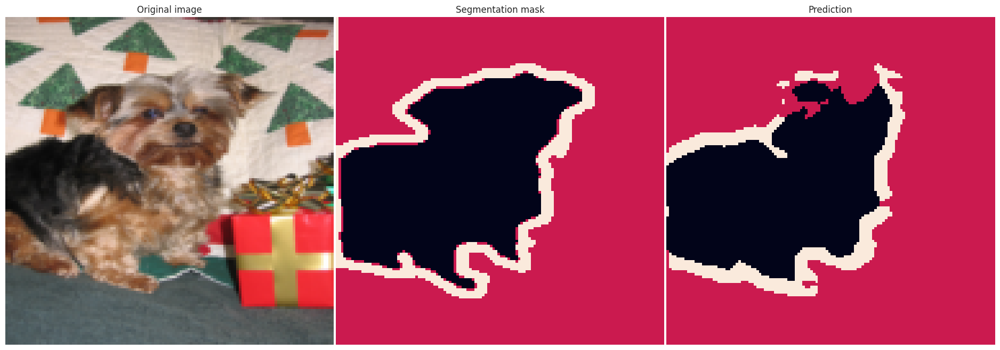

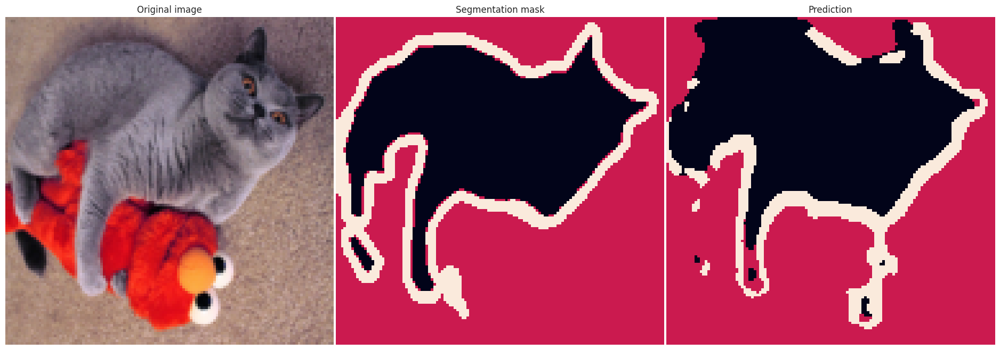

In [21]:
visualize(model, next(iter(train_loader)), device)

## Детекция

In [22]:
from torchvision.datasets import VOCDetection

dataset = VOCDetection('../datasets/voc', download=True)

Using downloaded and verified file: ../datasets/voc/VOCtrainval_11-May-2012.tar
Extracting ../datasets/voc/VOCtrainval_11-May-2012.tar to ../datasets/voc


In [23]:
len(dataset)

5717

In [24]:
dataset[0]

(<PIL.Image.Image image mode=RGB size=500x442>,
 {'annotation': {'folder': 'VOC2012',
   'filename': '2008_000008.jpg',
   'source': {'database': 'The VOC2008 Database',
    'annotation': 'PASCAL VOC2008',
    'image': 'flickr'},
   'size': {'width': '500', 'height': '442', 'depth': '3'},
   'segmented': '0',
   'object': [{'name': 'horse',
     'pose': 'Left',
     'truncated': '0',
     'occluded': '1',
     'bndbox': {'xmin': '53', 'ymin': '87', 'xmax': '471', 'ymax': '420'},
     'difficult': '0'},
    {'name': 'person',
     'pose': 'Unspecified',
     'truncated': '1',
     'occluded': '0',
     'bndbox': {'xmin': '158', 'ymin': '44', 'xmax': '289', 'ymax': '167'},
     'difficult': '0'}]}})

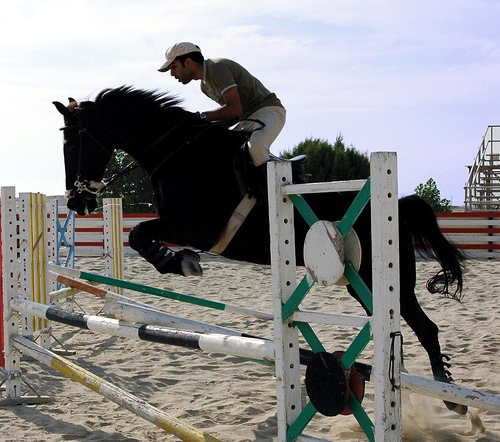

In [25]:
dataset[0][0]

In [26]:
target_names = []

for obj in dataset:
    target_names.extend([x['name'] for x in obj[1]['annotation']['object']])

target_names = list(set(target_names))

In [27]:
target_names

['horse',
 'train',
 'boat',
 'chair',
 'cow',
 'diningtable',
 'tvmonitor',
 'sheep',
 'bus',
 'motorbike',
 'sofa',
 'bird',
 'cat',
 'dog',
 'bottle',
 'car',
 'aeroplane',
 'bicycle',
 'pottedplant',
 'person']

In [28]:
target2idx = {name: i for i, name in enumerate(target_names)}
idx2target = {i: name for i, name in enumerate(target_names)}

target2idx, idx2target

({'horse': 0,
  'train': 1,
  'boat': 2,
  'chair': 3,
  'cow': 4,
  'diningtable': 5,
  'tvmonitor': 6,
  'sheep': 7,
  'bus': 8,
  'motorbike': 9,
  'sofa': 10,
  'bird': 11,
  'cat': 12,
  'dog': 13,
  'bottle': 14,
  'car': 15,
  'aeroplane': 16,
  'bicycle': 17,
  'pottedplant': 18,
  'person': 19},
 {0: 'horse',
  1: 'train',
  2: 'boat',
  3: 'chair',
  4: 'cow',
  5: 'diningtable',
  6: 'tvmonitor',
  7: 'sheep',
  8: 'bus',
  9: 'motorbike',
  10: 'sofa',
  11: 'bird',
  12: 'cat',
  13: 'dog',
  14: 'bottle',
  15: 'car',
  16: 'aeroplane',
  17: 'bicycle',
  18: 'pottedplant',
  19: 'person'})

In [29]:
def target_transform(voc_target):
    target = {}
    
    target['boxes'] = torch.tensor(
        [
            [
                float(x['bndbox']['xmin']),
                float(x['bndbox']['ymin']),
                float(x['bndbox']['xmax']),
                float(x['bndbox']['ymax'])
            ] for x in voc_target['annotation']['object']
        ],
        dtype=torch.float32
    )
    target['labels'] = torch.tensor([target2idx[x['name']] for x in voc_target['annotation']['object']], dtype=torch.int64)
    
    return target

In [30]:
target_transform(dataset[0][1])

{'boxes': tensor([[ 53.,  87., 471., 420.],
         [158.,  44., 289., 167.]]),
 'labels': tensor([ 0, 19])}

In [31]:
from torchvision.utils import draw_bounding_boxes


def show(imgs):
    to_pil = T.ToPILImage()
    
    if not isinstance(imgs, list):
        imgs = [imgs]

    fix, axs = plt.subplots(ncols=len(imgs), squeeze=False, figsize=(16, 8))

    for i, img in enumerate(imgs):
        img = img.detach()
        img = to_pil(img)
        axs[0, i].imshow(np.asarray(img))
        axs[0, i].set(xticklabels=[], yticklabels=[], xticks=[], yticks=[])

def draw_boxes_single_image(image, boxes, labels):
    colors = ["red" for _ in boxes]

    show(draw_bounding_boxes(image, boxes, labels, colors=colors, width=5))

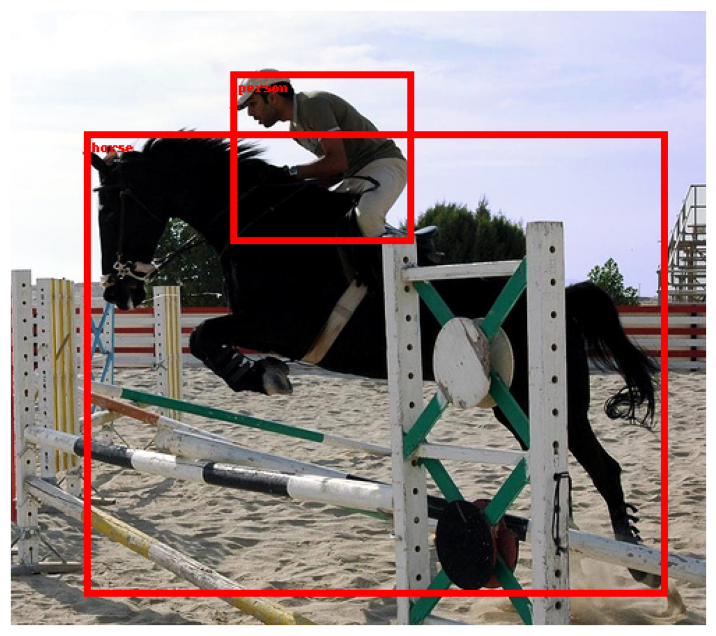

In [32]:
draw_boxes_single_image(
    T.PILToTensor()(dataset[0][0]),
    target_transform(dataset[0][1])['boxes'],
    [idx2target[label.item()] for label in target_transform(dataset[0][1])['labels']]
)

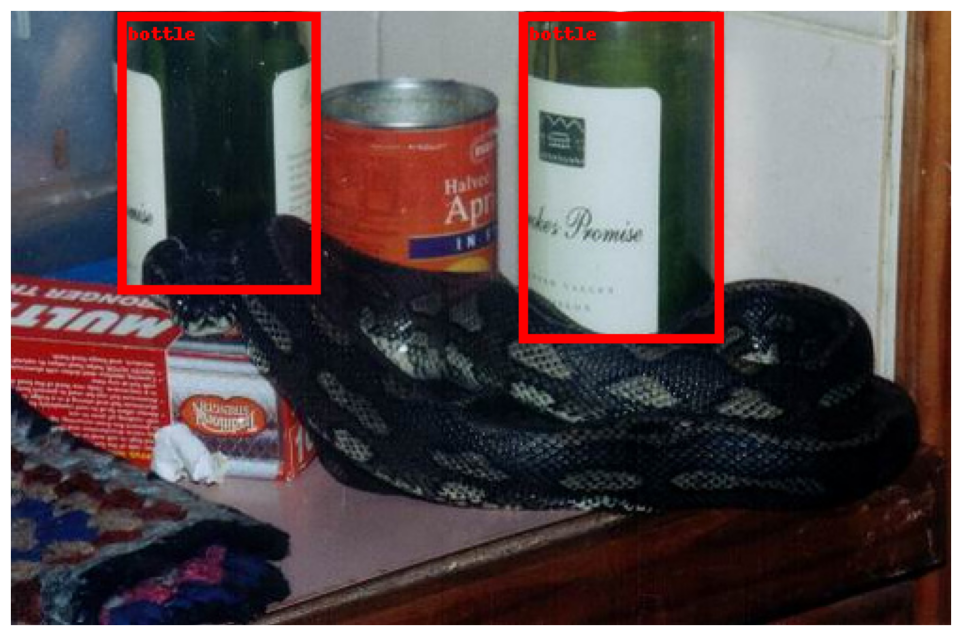

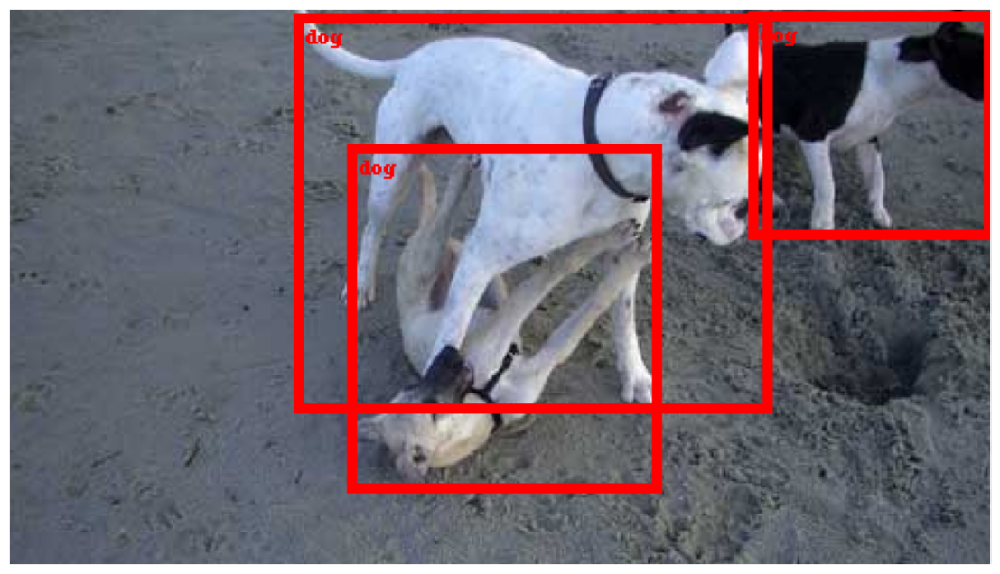

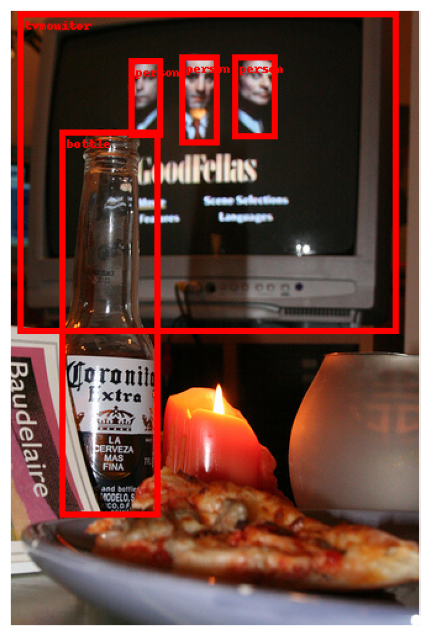

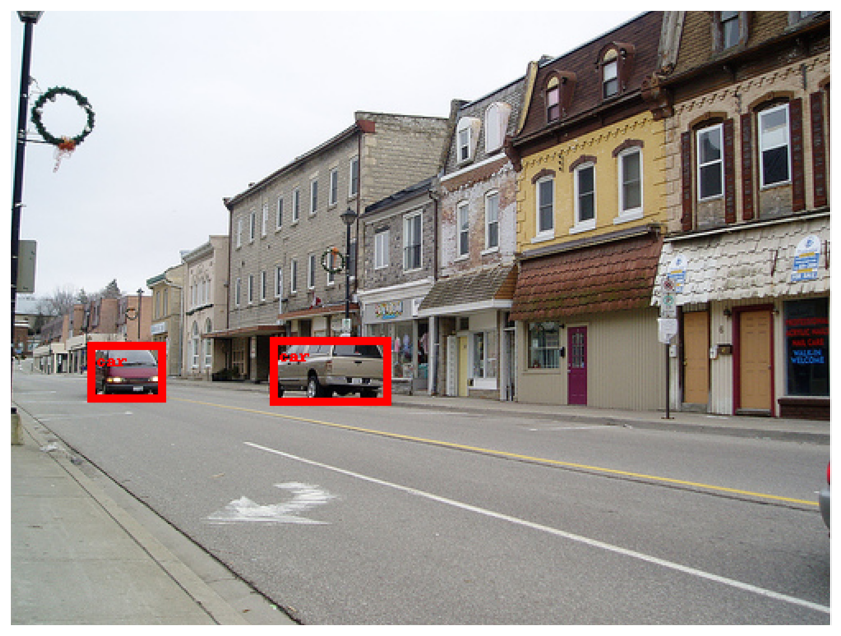

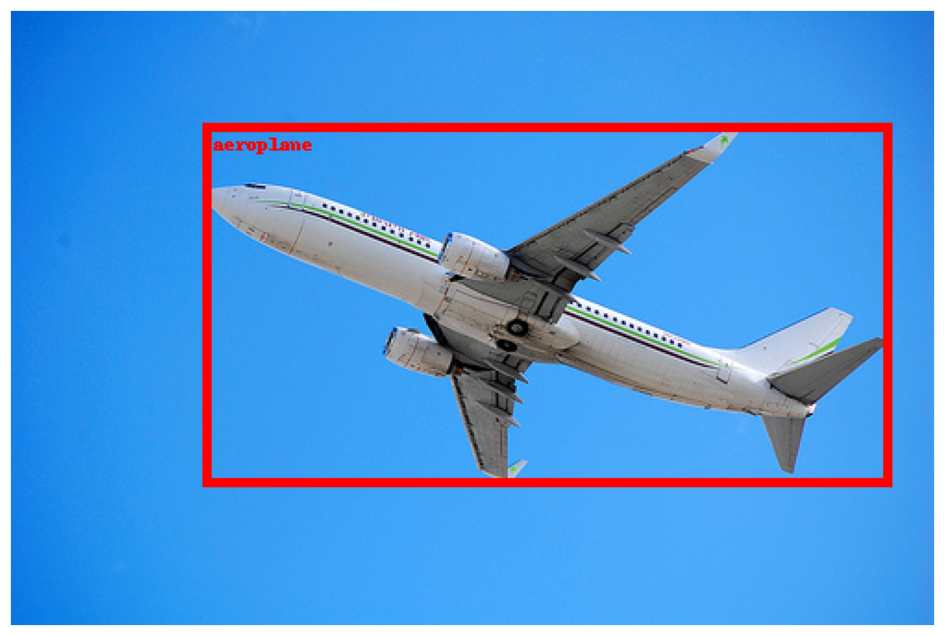

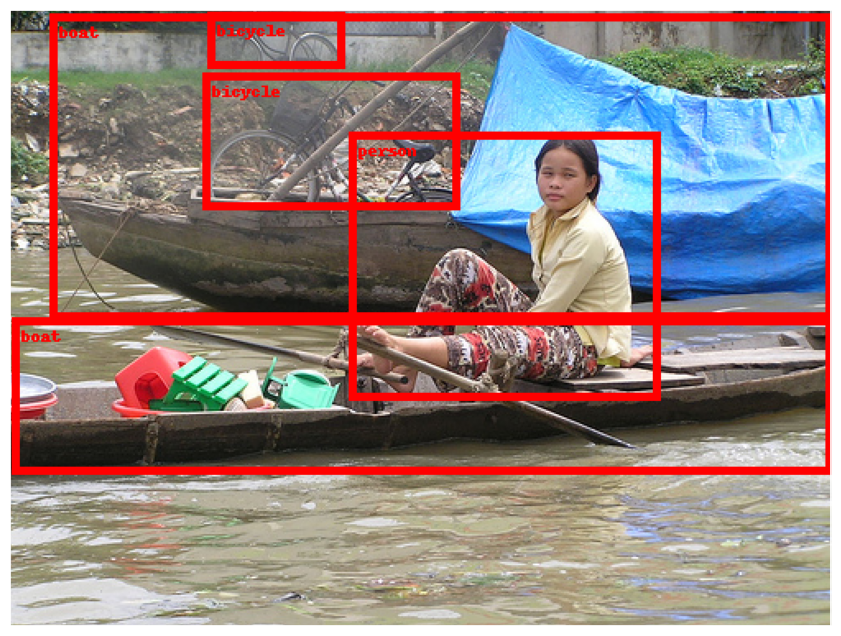

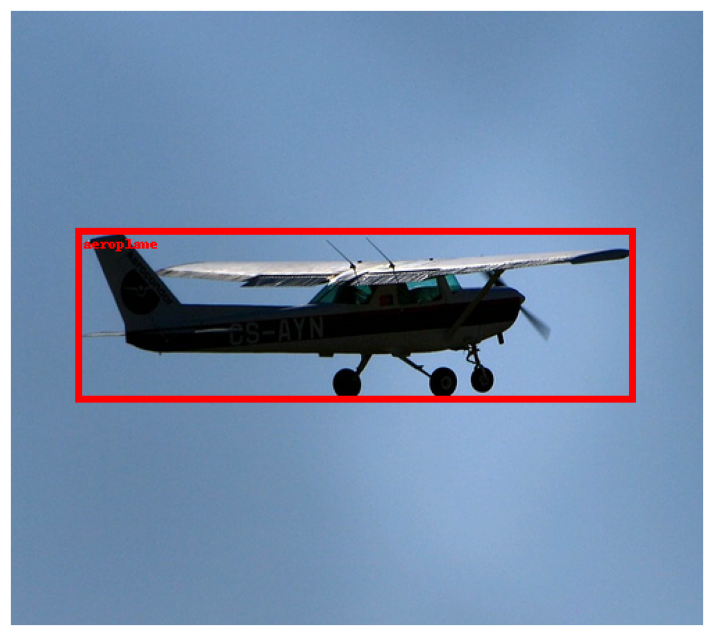

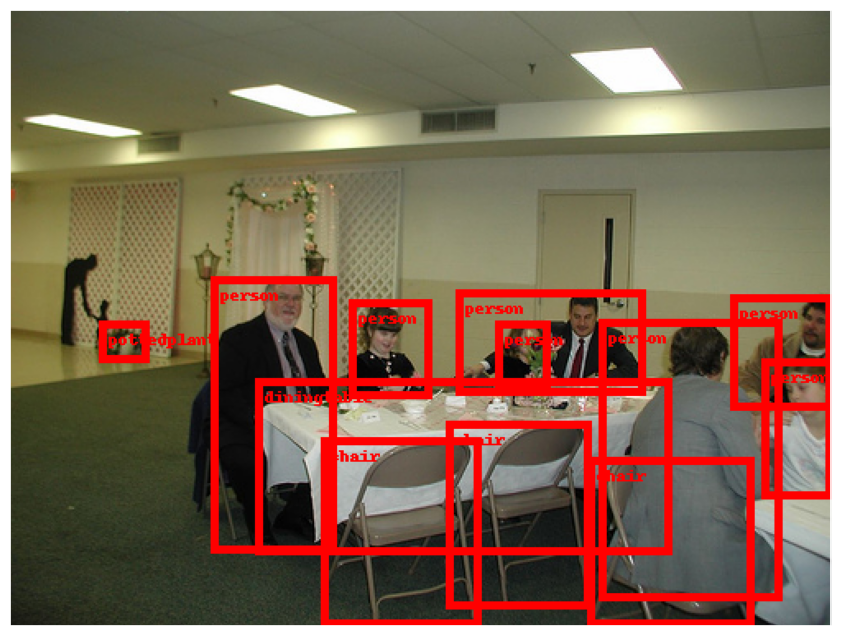

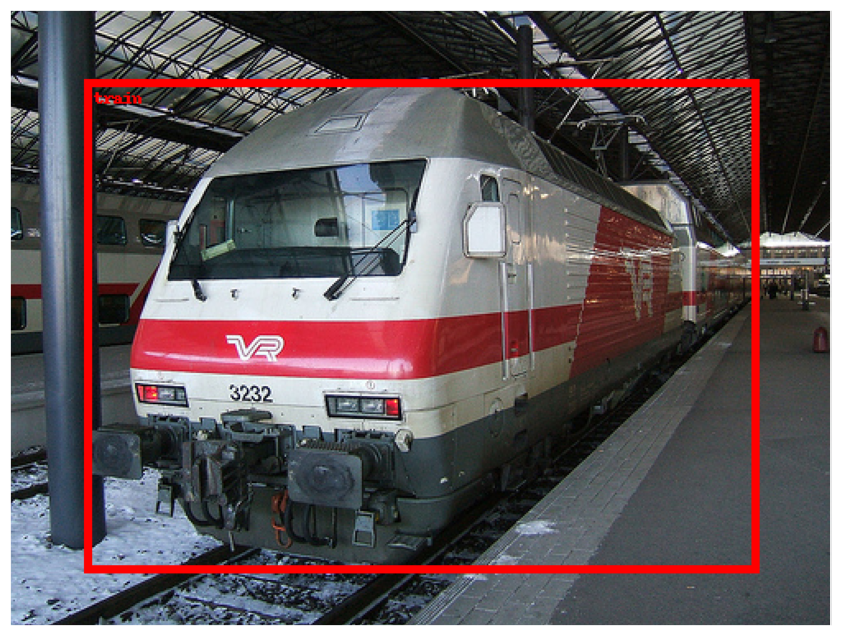

In [33]:
for i in range(1, 10):
    draw_boxes_single_image(
        T.PILToTensor()(dataset[i][0]),
        target_transform(dataset[i][1])['boxes'],
        [idx2target[label.item()] for label in target_transform(dataset[i][1])['labels']]
    )

In [34]:
def collate_fn(batch):
    return tuple(zip(*batch))


train_dataset = VOCDetection(
    '../datasets/voc',
    image_set='train',
    transform=T.ToTensor(),
    target_transform=target_transform
)

valid_dataset = VOCDetection(
    '../datasets/voc',
    image_set='val',
    transform=T.ToTensor(),
    target_transform=target_transform
)

train_loader = DataLoader(train_dataset, batch_size=4, shuffle=True, num_workers=8, pin_memory=True, collate_fn=collate_fn)
valid_loader = DataLoader(valid_dataset, batch_size=4, shuffle=False, num_workers=8, pin_memory=True, collate_fn=collate_fn)

/usr/local/lib/python3.10/dist-packages/torchvision/transforms/v2/_deprecated.py:43: UserWarning: The transform `ToTensor()` is deprecated and will be removed in a future release. Instead, please use `v2.Compose([v2.ToImage(), v2.ToDtype(torch.float32, scale=True)])`.
  warnings.warn(


In [37]:
from torchvision.models.detection import fasterrcnn_resnet50_fpn_v2, FasterRCNN_ResNet50_FPN_V2_Weights
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor


def get_detection_model():
    model = fasterrcnn_resnet50_fpn_v2(weights=FasterRCNN_ResNet50_FPN_V2_Weights.COCO_V1)

    model.requires_grad_(False)

    model.roi_heads.box_predictor = FastRCNNPredictor(1024, len(target_names))

    return model

In [38]:
model = get_detection_model()

In [39]:
model

FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
       

In [40]:
from torchvision.ops import batched_nms


def intersection_over_union(dt_bbox, gt_bbox):
    int_x0 = max(dt_bbox[0], gt_bbox[0])
    int_y0 = max(dt_bbox[1], gt_bbox[1])

    int_x1 = min(dt_bbox[2], gt_bbox[2])
    int_y1 = min(dt_bbox[3], gt_bbox[3])

    intersection = max(int_x1 - int_x0, 0) * max(int_y1 - int_y0, 0)
    dt_area = (dt_bbox[2] - dt_bbox[0]) * (dt_bbox[3] - dt_bbox[1])
    gt_area = (gt_bbox[2] - gt_bbox[0]) * (gt_bbox[3] - gt_bbox[1])

    return intersection / (dt_area + gt_area - intersection)


def apply_nms(orig_prediction, iou_thresh=0.3):

    keep = batched_nms(orig_prediction['boxes'], orig_prediction['scores'], orig_prediction['labels'], iou_thresh)

    final_prediction = orig_prediction

    final_prediction['boxes'] = final_prediction['boxes'][keep]
    final_prediction['scores'] = final_prediction['scores'][keep]
    final_prediction['labels'] = final_prediction['labels'][keep]
    
    return final_prediction


@torch.inference_mode()
def visualize(model, batch, device):
    model.eval()
    
    to_pil = T.ToPILImage()
    to_tensor = T.PILToTensor()

    xs, ys = batch

    for i, (x, y) in enumerate(zip(xs, ys)):
        prediction = {k: v.to(device) for k, v in model([x.to(device)])[0].items()}

        prediction = apply_nms(prediction)

        x = to_tensor(to_pil(x.cpu()))

        true_boxes = draw_bounding_boxes(x, boxes=y['boxes'], labels=[idx2target[label.item()] for label in y['labels']], width=5, colors='red')
        predicted_boxes = draw_bounding_boxes(x, boxes=prediction['boxes'], labels=[idx2target[label.item()] for label in prediction['labels']], width=5, colors='red')
        
        fig, ax = plt.subplots(1, 2, figsize=(20, 10), facecolor='white')

        ax[0].imshow(to_pil(true_boxes))
        ax[1].imshow(to_pil(predicted_boxes))

        ax[0].axis('off')
        ax[1].axis('off')

        ax[0].set_title('Target boxes')
        ax[1].set_title('Predicted boxes')

        plt.subplots_adjust(wspace=0, hspace=0.1)
        plt.show()

        if i >= 9:
            break

In [41]:
import torch.nn as nn
from torch.utils.data import DataLoader
from torch.optim import Optimizer
from tqdm import tqdm


def train(model: nn.Module, data_loader: DataLoader, optimizer: Optimizer, device: torch.device):
    model.train()

    for x, y in tqdm(data_loader):
        x = list(_.to(device).float() for _ in x)
        y = [{k: v.to(device) for k, v in t.items()} for t in y]

        optimizer.zero_grad()

        output = model(x, y)

        loss_sum = sum(loss for loss in output.values())

        loss_sum.backward()

        optimizer.step()

In [42]:
! pip install torchmetrics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 805.2/805.2 KB 4.2 MB/s eta 0:00:0000:0100:01


In [43]:
import torch
import torch.nn as nn
from torch.utils.data import DataLoader

from torchmetrics.detection.mean_ap import MeanAveragePrecision


@torch.inference_mode()
def evaluate(model: nn.Module, data_loader: DataLoader, device: torch.device):
    model.eval()

    metric = MeanAveragePrecision()

    for x, y in tqdm(data_loader):
        x = list(_.to(device).float() for _ in x)

        output = model(x)

        output = [{k: v.cpu() for k, v in t.items()} for t in output]

        metric.update(output, y)

    return metric.compute()['map']


In [44]:
from IPython.display import clear_output


def fit(model, train_loader, valid_loader, optimizer, device, num_epochs, title):

    train_iterator = iter(train_loader)
    valid_iterator = iter(valid_loader)

    for epoch in range(num_epochs):
        train(model, train_loader, optimizer, device)

        clear_output()

        visualize(model, next(train_iterator), device)
        visualize(model, next(valid_iterator), device)

In [45]:
model = get_detection_model().to(device)

optimizer = Adam([p for p in model.parameters() if p.requires_grad], lr=1e-4)

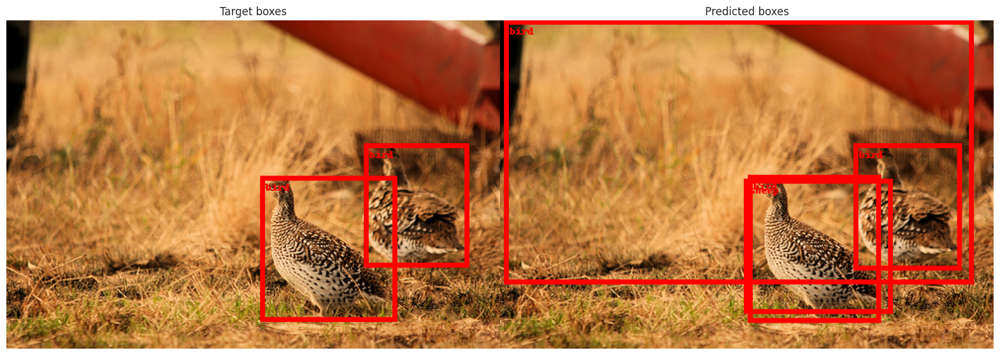

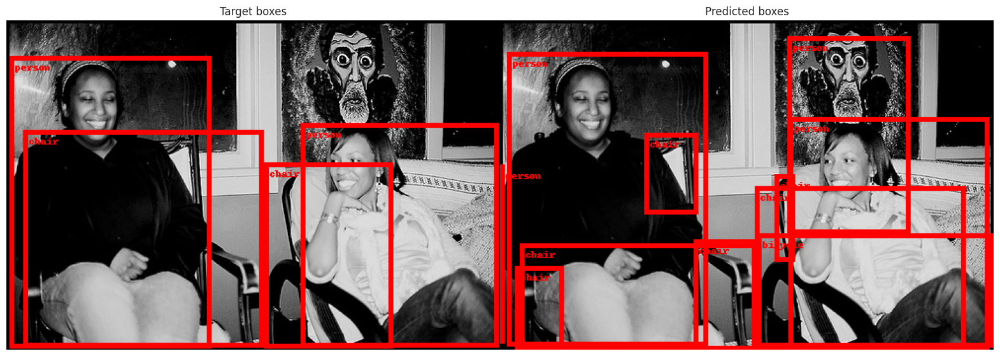

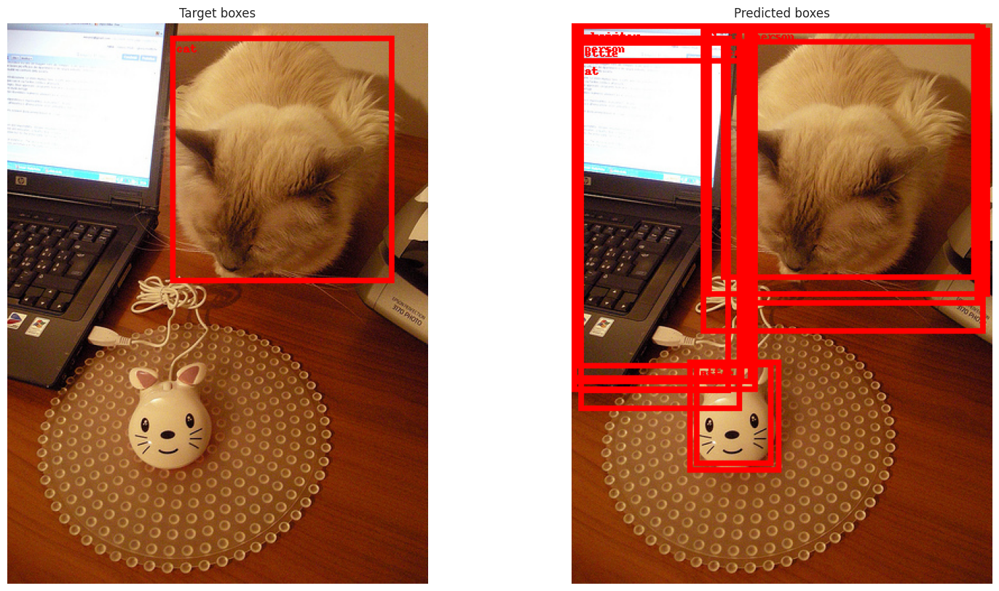

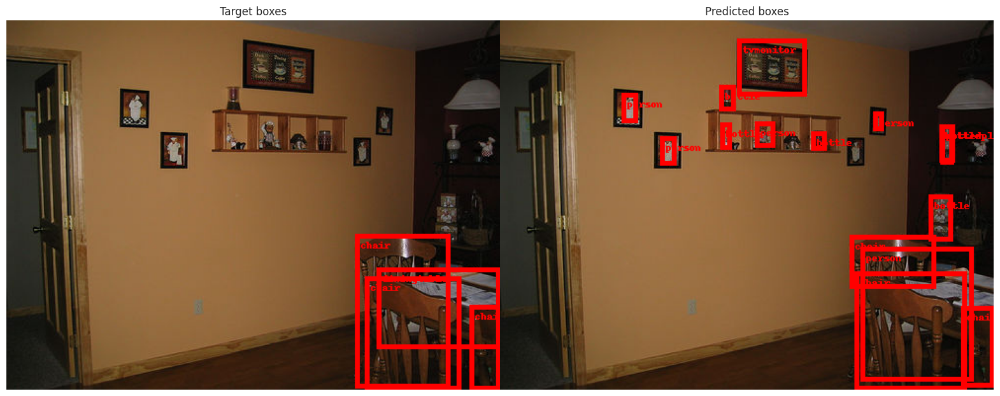

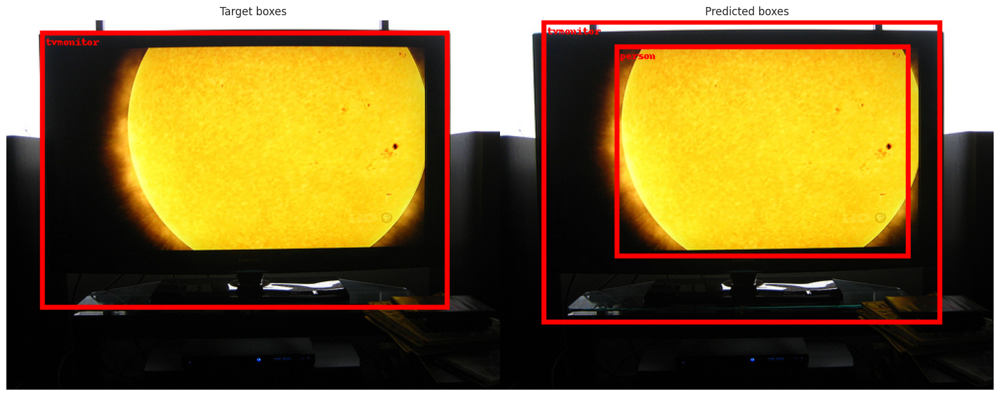

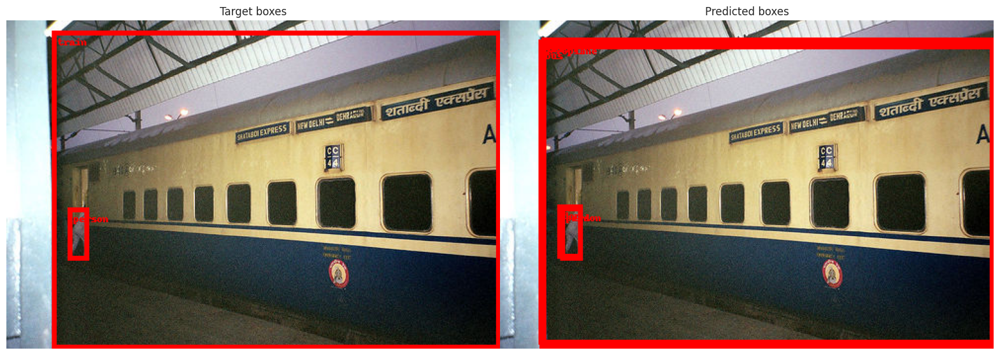

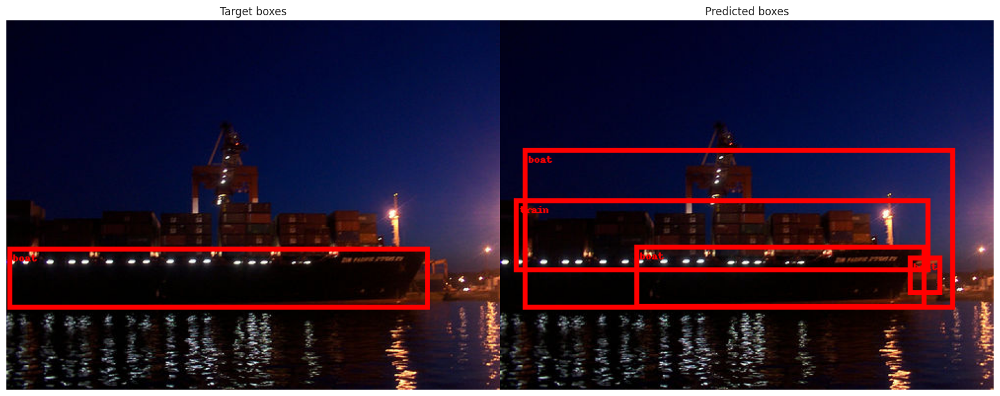

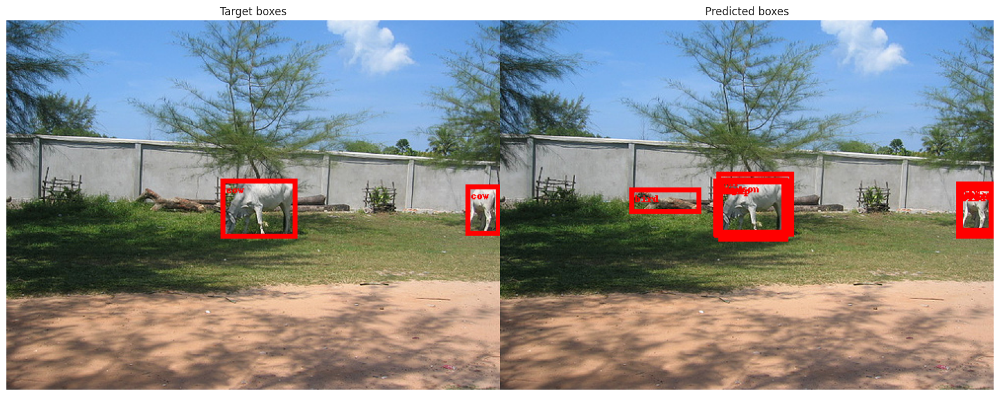

  3%|▎         | 46/1430 [00:05<02:33,  9.00it/s]


KeyboardInterrupt: 

In [46]:
fit(model, train_loader, valid_loader, optimizer, device, 5, 'Faster R-CNN finetune')

In [ ]:
visualize(model, next(iter(train_loader)), device)

In [49]:
train_map = evaluate(model, train_loader, device)
valid_map = evaluate(model, valid_loader, device)

print(f'Train mAP {train_map:.5f} Valid mAP {valid_map:.5f}')

ModuleNotFoundError: `MAP` metric requires that `pycocotools` installed. Please install with `pip install pycocotools` or `pip install torchmetrics[detection]`

In [48]:
! pip install torchmetrics[detection]

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 426.2/426.2 KB 2.8 MB/s eta 0:00:00a 0:00:01
